In [2]:
%load_ext autoreload
%autoreload 2

import os
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import iqr
from astropy.coordinates import SkyCoord, EarthLocation, AltAz, ICRS
from astropy.time import Time
from astropy.timeseries import LombScargle
from astropy.wcs import WCS
from astropy import units as u
from astropy.io import fits
from astropy import constants
from astropy.modeling.models import BlackBody
from astropy.visualization import quantity_support
#Move up to RAFTS directory
if os.getcwd().endswith('/RAFTS'):
    pass
else:
    os.chdir('..')
from utils import filt_interp, dpar, dtan, lamb_eff_md, dcr_offset, celest_to_pa, inverse_Teff, inverseTeff, inverseWeff, lorentzian, find_min_max_adjacent, variance_weighted_mean, chrDistAng
import globals

from config import *

from photutils.psf import IntegratedGaussianPRF, PSFPhotometry
from photutils.detection import DAOStarFinder
from photutils import CircularAperture
from photutils.background import MMMBackground, LocalBackground

from tqdm import tqdm

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ModuleNotFoundError: No module named 'photutils'

In [10]:
D2ARCSEC = 3_600
DAY2SEC = 24 * 3_600
flr_id = 11

In [5]:
#PARAMS
flare_ref_pos = np.array([323.0, 429.5])

filters = ['u', 'g', 'r', 'i', 'z', 'y']

filtercolors = {
            "u": "#66CCEE",
            "g": "#228833",
            "r": "#CCBB44",
            "i": "#EE6677",
            "z": "#AA3377",
            "y": "#4B3713",
            " ": None}

In [ ]:
hdu_list = fits.open('dwfflare/0a7936112f3150350b27277900f88de2_c4d_151218_061807_ooi_g_v1.fits.fz')
hdu_list.info()

Filename: /Users/riley/Desktop/RAFTS/dwfflare/0a7936112f3150350b27277900f88de2_c4d_151218_061807_ooi_g_v1.fits.fz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     251   ()      
  1  S29           1 CompImageHDU    129   (2046, 4094)   float32   
  2  S31           1 CompImageHDU    129   (2046, 4094)   float32   
  3  S25           1 CompImageHDU    129   (2046, 4094)   float32   
  4  S26           1 CompImageHDU    129   (2046, 4094)   float32   
  5  S27           1 CompImageHDU    129   (2046, 4094)   float32   
  6  S28           1 CompImageHDU    129   (2046, 4094)   float32   
  7  S20           1 CompImageHDU    129   (2046, 4094)   float32   
  8  S21           1 CompImageHDU    129   (2046, 4094)   float32   
  9  S22           1 CompImageHDU    129   (2046, 4094)   float32   
 10  S23           1 CompImageHDU    129   (2046, 4094)   float32   
 11  S24           1 CompImageHDU    129   (2046, 4094)   float32   
 12  S14      

In [18]:
flare = pd.read_csv("Outdata/flare_df.csv")#, names=["mjd", "dpar_detrended")
flare = flare.sort_values(by="mjd")
dpar_arr = np.load("Outdata/dpar_arr.npy")


In [14]:
imnames_timeordered = np.load('Outdata/imnames_timeordered.npy')
main_df = pd.read_csv("Outdata/main_df.csv")#, names=["mjd", "dpar_detrended")

t_index = []
for i, time in enumerate(main_df['time'].dropna().unique()):

    if (main_df['time'][main_df['id'] == flr_id].values == time).any():
        t_index.append(True)

    else:
        t_index.append(False) 
        
g_flux = main_df[main_df['id'] == flr_id]['flux_fit']
g_flux_err = main_df[main_df['id'] == flr_id]['flux_err']
flr_times = main_df[main_df['id'] == flr_id]['time']
g_mag = 22.5 - 2.5 * np.log10(g_flux.values)
g_mag_err = (2.5/np.log(10)) * (g_flux_err/g_flux)
g_mag_err = g_mag_err.values
delta_g_mag = g_mag - np.mean(g_mag[((flr_times - flr_times.iloc[0]) * DAY2SEC) < 1000])
delta_g_mag_err = g_mag_err - np.sqrt(np.sum(g_mag_err[((flr_times - flr_times.iloc[0]) * DAY2SEC) < 1000] ** 2)) /  len(g_mag_err[((flr_times - flr_times.iloc[0]) * DAY2SEC) < 1000])


for i, t in enumerate(t_index):
    if not t:
        delta_g_mag = np.insert(delta_g_mag, i, np.nan)
        delta_g_mag_err = np.insert(delta_g_mag_err, i, np.nan)
    else:
        pass

delta_g_mag, delta_g_mag_err

(array([ 4.50540586e-02,             nan,             nan,  6.18003671e-02,
        -2.75031746e-01,  1.53599598e-01,  5.28521951e-02, -2.06404632e-01,
         9.97016979e-02, -1.09199890e-01,  9.59371004e-02, -1.93514136e-02,
                    nan,  1.02343554e-01,  1.59777841e-02,             nan,
                    nan,  5.61083883e-03,  1.00573270e-01, -7.53870994e-02,
        -4.80756832e-02, -1.78392940e-02,  1.22433058e-02,  2.76158036e-01,
                    nan,  2.72314214e-01,  3.80101782e-01, -2.86631927e-01,
         1.46376557e-03, -3.65414442e-01, -6.12486939e+00, -5.82499183e+00,
        -5.41354601e+00, -5.03078173e+00, -4.55342130e+00, -4.17228568e+00,
        -3.89542434e+00, -3.66042475e+00, -3.33475428e+00, -3.13259622e+00,
        -2.91099073e+00, -2.74375166e+00, -2.54332689e+00, -2.41273437e+00,
        -2.29597276e+00, -2.15847218e+00, -1.98008144e+00, -1.94049208e+00,
        -1.87694650e+00, -1.77485261e+00, -1.62054447e+00, -1.73878246e+00,
        -1.7

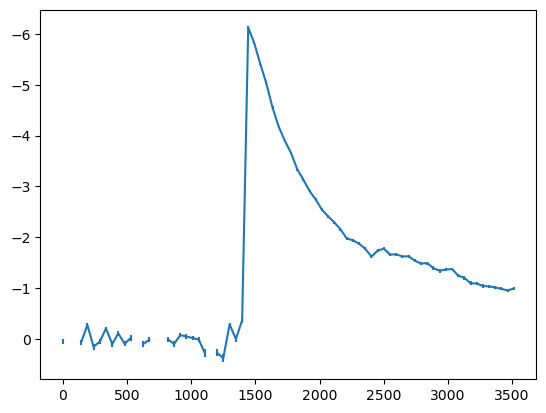

In [15]:
times = main_df['time'].dropna().unique() 
# you were doing this subtraction and the conversion to second 50 times and then you were creating this variable way below...
tSec = (times - times[0]) * DAY2SEC
plt.errorbar(tSec, delta_g_mag, yerr=delta_g_mag_err)
plt.gca().invert_yaxis()

In [ ]:
#Collect DATE-OBS list
datelist = []

for i, imname in enumerate(imnames):
    try:
        image_header = fits.getheader('dwfflare/' + imname, ext=0)
        datelist.append(image_header['DATE-OBS'])

    except:
        print(i, 'EXT not found')
        datelist.append(image_header['DATE-OBS'])

datearr = np.array(datelist)

44 EXT not found
129 EXT not found


## PSF Fitting

In [17]:
start = 8
end = 82

In [18]:
times = np.array([time.mjd for time in times[start:end]])

## Vector GIF visualization

In [16]:
ras = np.zeros((74, 110)) #74 time stamps, 110 stars RA in deg
decs = np.zeros((74, 110)) #74 time stamps, 110 stars Dec in deg

for j, id in (enumerate(np.sort(main_df['id'].dropna().unique()))): #for every star
    print(f"star id {j}")
    for i, t in (enumerate(main_df['time'].dropna().unique())): #for every time stamp
        if main_df['RA'][(main_df['id'] == id) * (main_df['time'] == t)].dropna().values:
            ras[i,j] = main_df['RA'][(main_df['id'] == id) * (main_df['time'] == t)].dropna().values
            decs[i,j] = main_df['DEC'][(main_df['id'] == id) * (main_df['time'] == t)].dropna().values
        else:
            ras[i,j] = np.nan
            decs[i,j] = np.nan
    

star id 0
star id 1
star id 2
star id 3
star id 4
star id 5
star id 6
star id 7
star id 8
star id 9
star id 10
star id 11
star id 12
star id 13
star id 14
star id 15
star id 16
star id 17
star id 18
star id 19
star id 20
star id 21
star id 22
star id 23
star id 24
star id 25
star id 26
star id 27
star id 28
star id 29
star id 30
star id 31
star id 32
star id 33
star id 34
star id 35
star id 36
star id 37
star id 38
star id 39
star id 40
star id 41
star id 42
star id 43
star id 44
star id 45
star id 46
star id 47
star id 48
star id 49
star id 50
star id 51
star id 52
star id 53
star id 54
star id 55
star id 56
star id 57
star id 58
star id 59
star id 60
star id 61
star id 62
star id 63
star id 64
star id 65
star id 66
star id 67
star id 68
star id 69
star id 70
star id 71
star id 72
star id 73
star id 74
star id 75
star id 76
star id 77
star id 78
star id 79
star id 80
star id 81
star id 82
star id 83
star id 84
star id 85
star id 86
star id 87
star id 88
star id 89
star id 90
star id 9

In [1]:
imname = imnames_timeordered[start]

imnameS18 = imname[:-8] + '_S18' + imname[-8:]
data = fits.getdata('dwfflare/dwfflareS18/' + imnameS18)
header = fits.getheader('dwfflare/dwfflareS18/' + imnameS18)
exp_header = fits.getheader('dwfflare/' + imname)
wcs = WCS(header)
time = Time(header['DATE-OBS'])
linescale = 500
mtn = EarthLocation.of_site('Cerro Tololo')

ccdcenter = SkyCoord(ra = header['RA1'], dec = header['DEC1'], unit=(u.hourangle, u.deg))
planecenter = SkyCoord(ra = header['CENRA1'], dec = header['CENDEC1'], unit=(u.hourangle, u.deg))
zenith = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = time, location=mtn)).transform_to(ICRS())
ccdcenter_x, ccdcenter_y = wcs.world_to_pixel(ccdcenter)
planecenter_x, planecenter_y = wcs.world_to_pixel(planecenter)
pa = celest_to_pa(ccdcenter.ra.deg, ccdcenter.dec.deg, time, loc=mtn)
theta = np.deg2rad(pa)
x1 = -300

init_x = main_df[main_df['time'] == time.mjd].sort_values('id')['x_fit'].values
init_y = main_df[main_df['time'] == time.mjd].sort_values('id')['y_fit'].values
init_ra = ras[0,:]
init_dec = decs[0,:]
init_f = dpar_arr[0,:]
flr_f = dpar_arr[:,flr_id-1]

fig = plt.figure(figsize=(22,10))
ax = fig.add_subplot(projection=wcs)
ax.imshow(data, clim=(0,100), cmap='Greys_r')
ax.set_title('Seconds since observation start: {0:.0f}'.format((time.mjd - times[0]) * 3600 * 24), fontsize=14)
ax.annotate('Flare Star', xy=(flare_ref_pos[0], flare_ref_pos[1]), xytext=(flare_ref_pos[0]-1000, flare_ref_pos[1]-220), fontsize=14,
            arrowprops=dict(facecolor='white', edgecolor='black', shrink=0.1))

lon, lat = ax.coords
lon.set_ticks()
lon.set_ticks_position('lb')
lon.set_ticklabel_position('lb')
lon.set_axislabel('Dec (dms)', fontsize=14)
lat.set_ticks()
lat.set_ticks_position('lb')
lat.set_ticklabel_position('lb')
lat.set_axislabel('RA (hms)', fontsize=14, minpad=-0.4)

fig.savefig('Figures/start.png', dpi=300, bbox_inches='tight')
fig.show()

fig = plt.figure(figsize=(22,10))
ax = fig.add_subplot(projection=wcs)
ax.imshow(data, clim=(0,100), cmap='Greys_r')
ax.set_title('Seconds since observation start: {0:.0f}'.format((time.mjd - times[0]) * 3600 * 24), fontsize=14)
ax.annotate('Flare Star', xy=(flare_ref_pos[0], flare_ref_pos[1]), xytext=(flare_ref_pos[0]-1000, flare_ref_pos[1]-220), fontsize=14,
            arrowprops=dict(facecolor='white', edgecolor='black', shrink=0.1))
ax.arrow(ccdcenter_x, ccdcenter_y, dx=x1, dy=0, head_width=50, alpha=0.5, color='cyan', label='to NCP')
ax.arrow(ccdcenter_x, ccdcenter_y, dx=x1 * np.cos(-theta), dy=x1 * np.sin(-theta), head_width=50, alpha=0.5, color='yellow', label='to zenith')
ax.legend(loc='center right', fontsize=14, bbox_to_anchor=(-0.25, 0.5))

lon, lat = ax.coords
lon.set_ticks()
lon.set_ticks_position('lb')
lon.set_ticklabel_position('lb')
lon.set_axislabel('Dec (dms)', fontsize=14)
lat.set_ticks()
lat.set_ticks_position('lb')
lat.set_ticklabel_position('lb')
lat.set_axislabel('RA (hms)', fontsize=14, minpad=-0.4)

fig.savefig('Figures/start_arrows.png', dpi=300, bbox_inches='tight')
fig.show()

for c, imname in enumerate(imnames_timeordered[start+1:end]):
    imnameS18 = imname[:-8] + '_S18' + imname[-8:]
    data = fits.getdata('dwfflare/dwfflareS18/' + imnameS18)
    header = fits.getheader('dwfflare/dwfflareS18/' + imnameS18)
    exp_header = fits.getheader('dwfflare/' + imname)
    wcs = WCS(header)
    time = Time(header['DATE-OBS'])
    mtn = EarthLocation.of_site('Cerro Tololo')

    ccdcenter = SkyCoord(ra = header['RA1'], dec = header['DEC1'], unit=(u.hourangle, u.deg))
    planecenter = SkyCoord(ra = header['CENRA1'], dec = header['CENDEC1'], unit=(u.hourangle, u.deg))
    zenith = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = time, location=mtn)).transform_to(ICRS())
    ccdcenter_x, ccdcenter_y = wcs.world_to_pixel(ccdcenter)
    planecenter_x, planecenter_y = wcs.world_to_pixel(planecenter)
    pa = celest_to_pa(ccdcenter.ra.deg, ccdcenter.dec.deg, time, loc=mtn)
    theta = np.deg2rad(pa)
    x1 = -300

    x = main_df[main_df['time'] == time.mjd].sort_values('id')['x_fit'].values
    y = main_df[main_df['time'] == time.mjd].sort_values('id')['y_fit'].values
    flux = main_df[main_df['time'] == time.mjd].sort_values('id')['flux_fit'].values
    fluxerr = main_df[main_df['time'] == time.mjd].sort_values('id')['flux_err'].values
    ra = ras[times == time.mjd,:][0]
    dec = decs[times == time.mjd,:][0]
    f = proj_angles[times == time.mjd,:][0]

    fig = plt.figure(figsize=(22,10))
    gs = fig.add_gridspec(2, 2, width_ratios=(1, 2), height_ratios=(1, 1))

    ax = fig.add_subplot(gs[:, 0], projection=wcs)
    ax2 = fig.add_subplot(gs[0, 1], projection=None)
    ax3 = fig.add_subplot(gs[1, 1], projection=None)

    vmin = -180
    vmax = 180
    cmap = plt.cm.RdBu
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin, vmax))
    sm.set_array([])  # This is a dummy array for colorbar purposes

    ax.imshow(data, clim=(0,100), cmap='Greys_r')
    ax.scatter(init_ra, init_dec, facecolor='None', transform = ax.get_transform('icrs'), edgecolor=[cmap((f_val - vmin) / (vmax - vmin)) for f_val in f], 
               lw=0.5, s=125)  
    ax.arrow(ccdcenter_x, ccdcenter_y, dx=x1, dy=0, head_width=50, alpha=0.5, color='cyan', label='to NCP')
    ax.arrow(ccdcenter_x, ccdcenter_y, dx=x1 * np.cos(-theta), dy=x1 * np.sin(-theta), head_width=50, alpha=0.5, color='yellow', label='to zenith')
    ax.set_title('Seconds since observation start: {0:.0f}'.format((time.mjd - times[0]) * 3600 * 24), fontsize=14)
    ax.set_xlim(0, data.shape[1])
    ax.set_ylim(0, data.shape[0])
    ax.set_aspect('auto')
    #box = ax.get_position()
    #ax.set_position([box.x0, box.y0, box.width * 2, box.height * 2])

    ax.annotate('Flare Star', xy=(flare_ref_pos[0], flare_ref_pos[1]), xytext=(flare_ref_pos[0]-1000, flare_ref_pos[1]-220), fontsize=18,
            arrowprops=dict(facecolor='white', edgecolor='black', shrink=0.1))
    ax.legend(loc='center right', fontsize=14, bbox_to_anchor=(-0.25, 0.5))
    ax.tick_params(axis='both', labelsize=14) 

    for rai, deci, ra_val, dec_val, f_val in zip(init_ra, init_dec, ra, dec, f):

        if np.isnan(ra_val):
            pass
        else:
            color=cmap((f_val - vmin) / (vmax - vmin))
            ax.arrow(rai, deci, (ra_val - rai) * linescale, (dec_val - deci) * linescale, transform = ax.get_transform('icrs'),
                        linewidth = 0.1, head_width=0, head_length=0, color=color) 
    
    cbar = fig.colorbar(sm, ax=ax, fraction=0.1)  # The colorbar based on ScalarMappable
    cbar.set_label(r'$\Theta_\mathrm{zenith}}$ (degrees)', fontsize=14)
    cbar.ax.tick_params(labelsize=14) 

    lon, lat = ax.coords
    lon.set_ticks()
    lon.set_ticks_position('lb')
    lon.set_ticklabel_position('lb')
    lon.set_axislabel('Dec (dms)', fontsize=14)
    lat.set_ticks()
    lat.set_ticks_position('lb')
    lat.set_ticklabel_position('lb')
    lat.set_axislabel('RA (hms)', fontsize=14, minpad=-0.4)


    ax2.errorbar((main_df[main_df['id'] == flr_id]['time'] - main_df[main_df['id'] == flr_id]['time'].iloc[0]) * 3600 * 24, 
                 main_df[main_df['id'] == flr_id]['flux_fit'], main_df[main_df['id'] == flr_id]['flux_err'], 
                 color='k', marker='o', ls='None')
    ax2.scatter((main_df[(main_df['id'] == flr_id) * (main_df['time'] == time.mjd)]['time'] - main_df[main_df['id'] == flr_id]['time'].iloc[0]) * 3600 * 24, 
                main_df[(main_df['id'] == flr_id) * (main_df['time'] == time.mjd)]['flux_fit'], marker='o', s=200, lw=2, facecolor='white', edgecolor='k', zorder=2)
    ax2.vlines((times[times == time.mjd] - times[0]) * 3600 * 24, ax2.get_ylim()[0], ax2.get_ylim()[1], color='k', ls='--', alpha = 0.4, zorder=1)
    ax2.set_title('Flare Lightcurve')
    ax2.set_ylabel('PSF Flux', fontsize=14)
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position("right")

    ax3.errorbar((times - times[0]) * 3600 * 24, dpar_arr[:,flr_id-1] * 3600, yerr = deldpar_arr[:,flr_id-1] * 3600, color='k', marker='o', ls='None')
    ax3.plot((times - times[0]) * 3600 * 24, np.nanmean(dpar_arr, axis=1) * 3600, c='k', alpha=0.4, label='Non flare mean')
    ax3.scatter((times[times == time.mjd] - times[0]) * 3600 * 24, dpar_arr[np.where(times == time.mjd)[0][0],flr_id-1] * 3600, 
                marker='o', s=200, lw=2, facecolor='white', edgecolor='k', zorder=2)
    ax3.scatter((times[times == time.mjd] - times[0]) * 3600 * 24, np.nanmean(dpar_arr, axis=1)[np.where(times == time.mjd)[0][0]] * 3600, marker='o', s=50, lw=2, color='gray', alpha=1, zorder=2)
    ax3.vlines((times[times == time.mjd] - times[0]) * 3600 * 24, ax3.get_ylim()[0], ax3.get_ylim()[1], color='k', ls='--', alpha = 0.4, zorder=1)
    ax3.set_xlabel('Seconds since observation start', fontsize=14)
    ax3.set_ylabel(r'$\Delta$DCR (arcsec)', fontsize=14)
    ax3.set_title('Flare DCR')
    ax3.yaxis.tick_right()
    ax3.yaxis.set_label_position("right")

    fig.tight_layout()
    fig.savefig('Figures/vectorgif/vectorgif_{}.png'.format(c), dpi=100, bbox_inches='tight')
    #plt.show()

NameError: name 'imnames_timeordered' is not defined

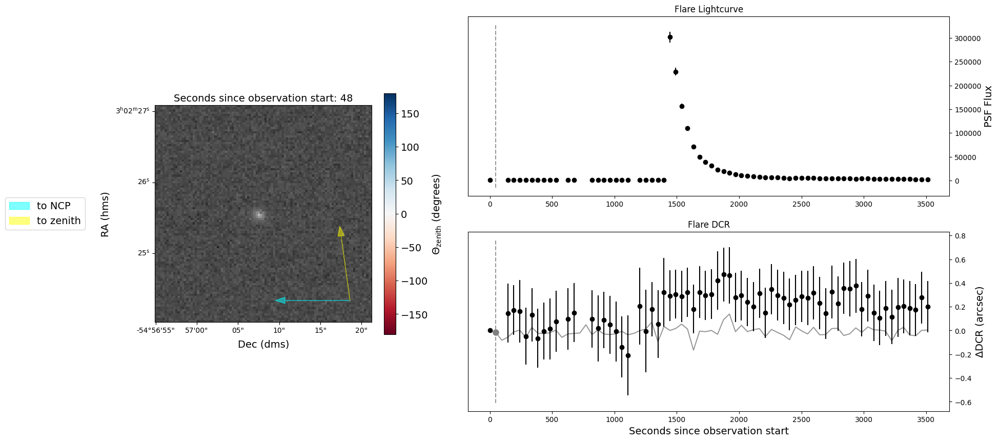

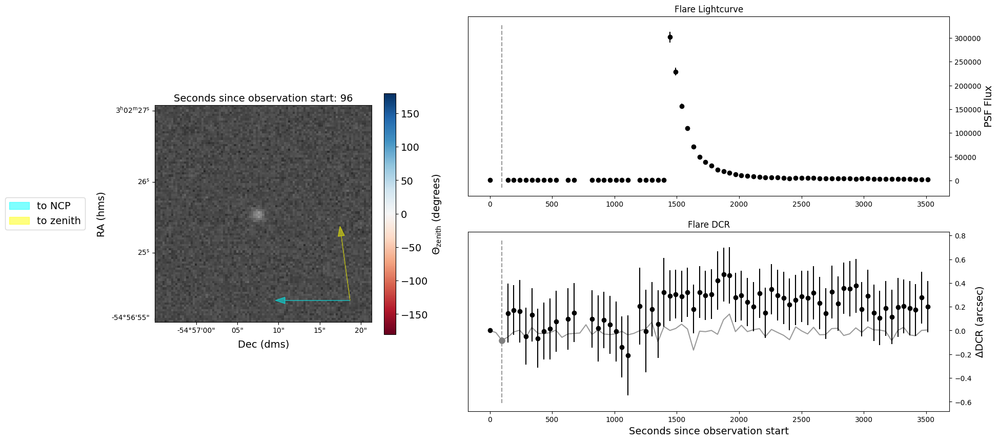

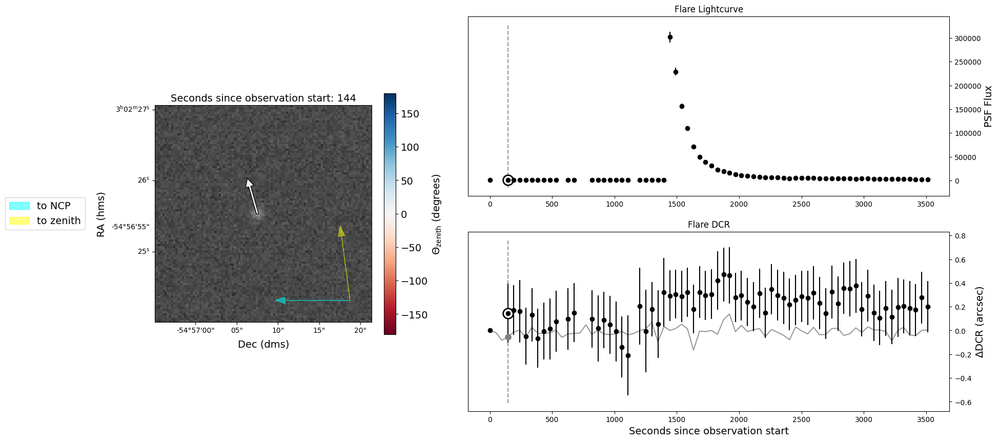

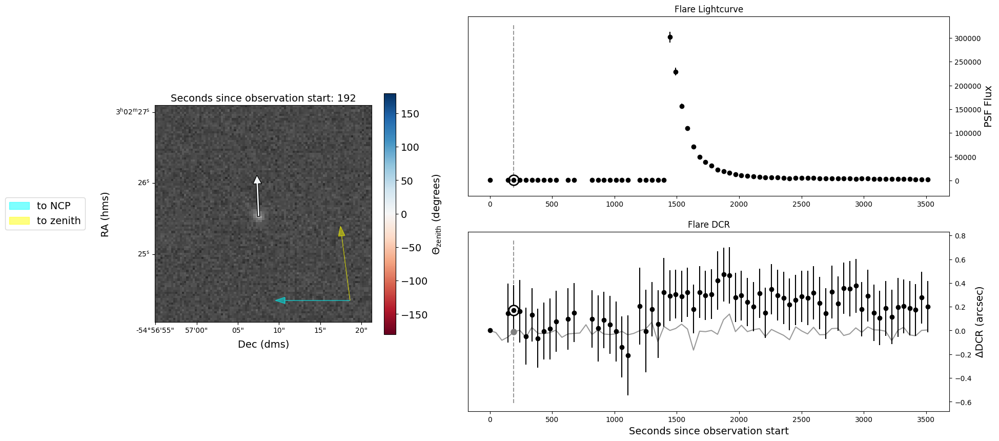

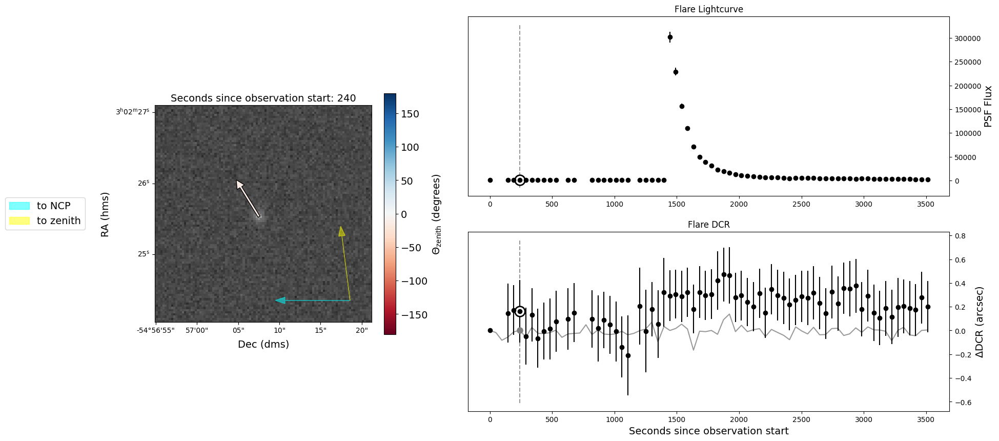

...

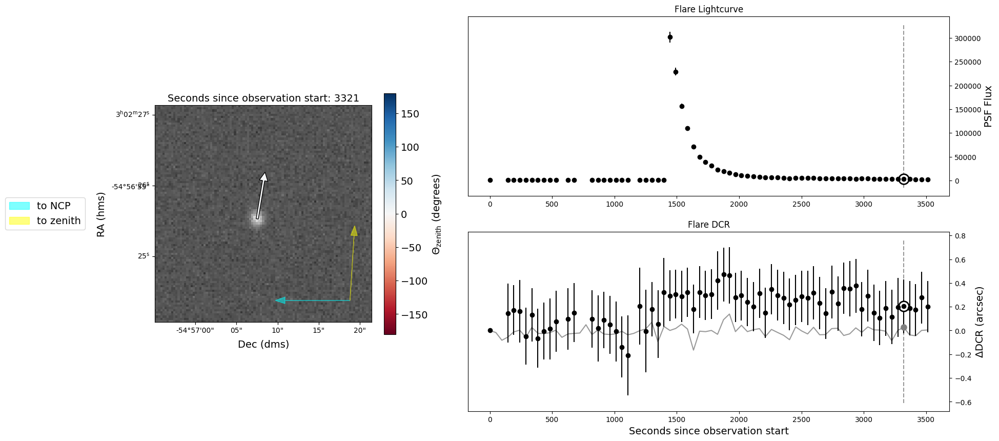

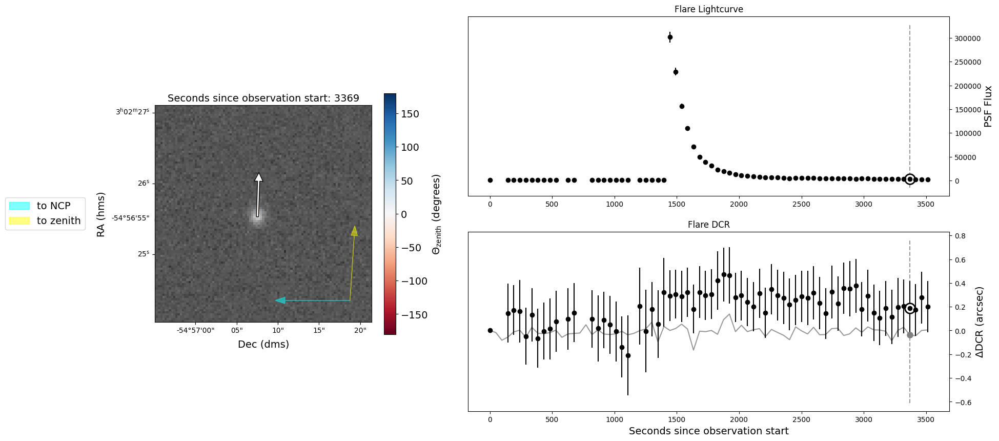

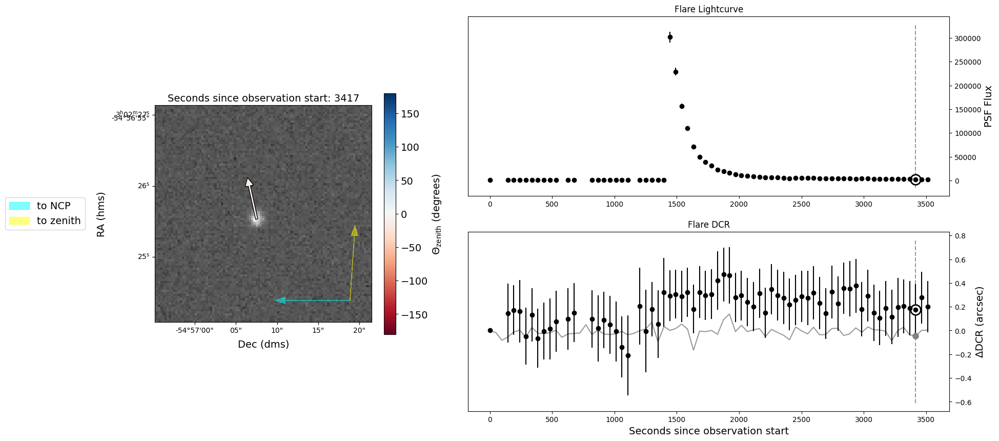

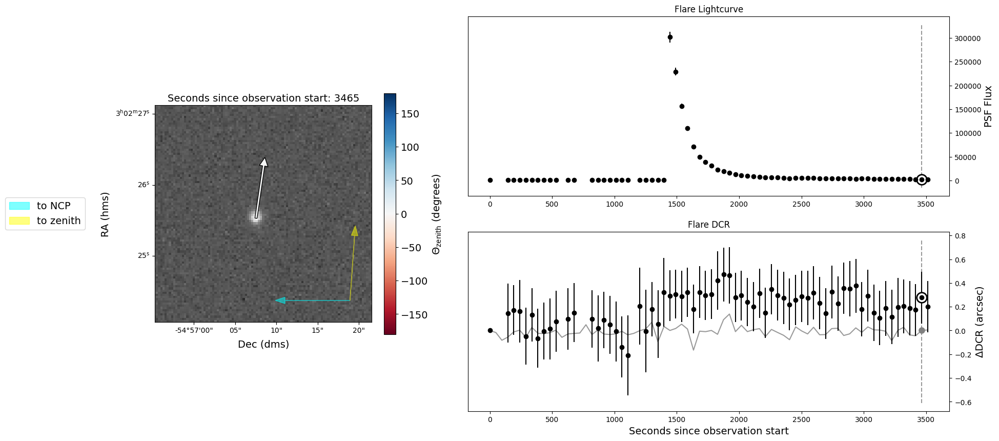

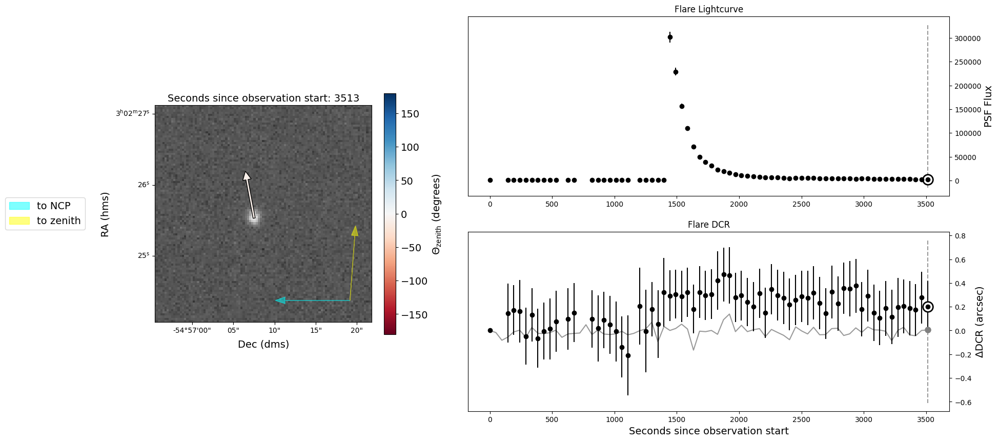

In [ ]:
for c, imname in enumerate(imnames_timeordered[start+1:end]):
    imnameS18 = imname[:-8] + '_S18' + imname[-8:]
    data = fits.getdata('dwfflare/dwfflareS18/' + imnameS18)
    header = fits.getheader('dwfflare/dwfflareS18/' + imnameS18)
    exp_header = fits.getheader('dwfflare/' + imname)
    wcs = WCS(header)
    time = Time(header['DATE-OBS'])
    mtn = EarthLocation.of_site('Cerro Tololo')
    linescale = 40

    ccdcenter = SkyCoord(ra = header['RA1'], dec = header['DEC1'], unit=(u.hourangle, u.deg))
    planecenter = SkyCoord(ra = header['CENRA1'], dec = header['CENDEC1'], unit=(u.hourangle, u.deg))
    zenith = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = time, location=mtn)).transform_to(ICRS())
    ccdcenter_x, ccdcenter_y = wcs.world_to_pixel(ccdcenter)
    planecenter_x, planecenter_y = wcs.world_to_pixel(planecenter)
    pa = celest_to_pa(ccdcenter.ra.deg, ccdcenter.dec.deg, time, loc=mtn)
    theta = np.deg2rad(pa)
    x1 = -30

    x = main_df[main_df['time'] == time.mjd].sort_values('id')['x_fit'].values
    y = main_df[main_df['time'] == time.mjd].sort_values('id')['y_fit'].values
    flux = main_df[main_df['time'] == time.mjd].sort_values('id')['flux_fit'].values
    fluxerr = main_df[main_df['time'] == time.mjd].sort_values('id')['flux_err'].values
    ra = ras[times == time.mjd,:][0]
    dec = decs[times == time.mjd,:][0]
    f = proj_angles[times == time.mjd,:][0]

    fig = plt.figure(figsize=(20, 10))
    gs = fig.add_gridspec(2, 2, width_ratios=(1, 2), height_ratios=(1, 1))

    ax = fig.add_subplot(gs[:, 0], projection=wcs)
    ax2 = fig.add_subplot(gs[0, 1], projection=None)
    ax3 = fig.add_subplot(gs[1, 1], projection=None)

    vmin = -180
    vmax = 180
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin, vmax))
    sm.set_array([])  # This is a dummy array for colorbar purposes
    
    ax.imshow(data, clim=(0,100), cmap='Greys_r')
    ax.arrow(flare_ref_pos[0]+40, flare_ref_pos[1]-40, dx=x1, dy=0, head_width=abs(x1)/10, alpha=0.5, color='cyan', label='to NCP')
    ax.arrow(flare_ref_pos[0]+40, flare_ref_pos[1]-40, dx=x1 * np.cos(-theta), dy=x1 * np.sin(-theta), head_width=abs(x1)/10, alpha=0.5, color='yellow', label='to zenith')
    ax.set_title('Seconds since observation start: {0:.0f}'.format((time.mjd - times[0]) * 3600 * 24), fontsize=14)
    ax.set_xlim(flare_ref_pos[0] - 50, flare_ref_pos[0] + 50)
    ax.set_ylim(flare_ref_pos[1] - 50, flare_ref_pos[1] + 50)
    ax.set_aspect('equal')

    for rai, deci, ra_val, dec_val, f_val in zip(init_ra, init_dec, ra, dec, f):

        if np.isnan(ra_val):
            pass
        else:
            xi, yi = wcs.world_to_pixel_values(rai, deci)
            x_val, y_val = wcs.world_to_pixel_values(ra_val, dec_val)
            color=cmap((f_val - vmin) / (vmax - vmin))
            ax.arrow(xi+1, yi+1, (x_val - xi) * linescale, (y_val - yi) * linescale,
                        width = 1, head_width=4, head_length=4, facecolor=color, edgecolor='k') 

    #if time.mjd in times[np.where(dpar_smoothed > 0.35)[0]]:
    #ax.scatter(flare_ref_pos[0], flare_ref_pos[1], marker='D', s=100, edgecolors='orange', facecolors='None', label='flare star')
    ax.legend(loc='center right', fontsize=14, bbox_to_anchor=(-0.3, 0.5))
    ax.tick_params(axis='both', fontsize=14)

    cbar = fig.colorbar(sm, ax=ax, fraction=0.05)  # The colorbar based on ScalarMappable
    cbar.set_label(r'$\Theta_\mathrm{zenith}}$ (degrees)', fontsize=14)
    cbar.ax.tick_params(labelsize=14)
    
    lon, lat = ax.coords
    lon.set_ticks()
    lon.set_ticks_position('lb')
    lon.set_ticklabel_position('lb')
    lon.set_axislabel('Dec (dms)', fontsize=14)
    lat.set_ticks()
    lat.set_ticks_position('lb')
    lat.set_ticklabel_position('lb')
    lat.set_axislabel('RA (hms)', fontsize=14, minpad=1.0)

    ax2.errorbar((main_df[main_df['id'] == flr_id]['time'] - main_df[main_df['id'] == flr_id]['time'].iloc[0]) * 3600 * 24, 
                 main_df[main_df['id'] == flr_id]['flux_fit'], main_df[main_df['id'] == flr_id]['flux_err'], 
                 color='k', marker='o', ls='None')
    ax2.scatter((main_df[(main_df['id'] == flr_id) * (main_df['time'] == time.mjd)]['time'] - main_df[main_df['id'] == flr_id]['time'].iloc[0]) * 3600 * 24, 
                main_df[(main_df['id'] == flr_id) * (main_df['time'] == time.mjd)]['flux_fit'], marker='o', s=200, lw=2, facecolor='white', edgecolor='k', zorder=2)
    ax2.vlines((times[times == time.mjd] - times[0]) * 3600 * 24, ax2.get_ylim()[0], ax2.get_ylim()[1], color='k', ls='--', alpha = 0.4, zorder=1)
    ax2.set_title('Flare Lightcurve')
    ax2.set_ylabel('PSF Flux', fontsize=14)
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position("right")

    ax3.errorbar((times - times[0]) * 3600 * 24, dpar_arr[:,flr_id-1] * 3600, yerr = deldpar_arr[:,flr_id-1] * 3600, color='k', marker='o', ls='None')
    ax3.plot((times - times[0]) * 3600 * 24, np.nanmean(dpar_arr, axis=1) * 3600, c='k', alpha=0.4, label='Non flare mean')
    ax3.scatter((times[times == time.mjd] - times[0]) * 3600 * 24, dpar_arr[np.where(times == time.mjd)[0][0],flr_id-1] * 3600, 
                marker='o', s=200, lw=2, facecolor='white', edgecolor='k', zorder=2)
    ax3.scatter((times[times == time.mjd] - times[0]) * 3600 * 24, np.nanmean(dpar_arr, axis=1)[np.where(times == time.mjd)[0][0]] * 3600, marker='o', s=50, lw=2, color='gray', alpha=1, zorder=2)
    ax3.vlines((times[times == time.mjd] - times[0]) * 3600 * 24, ax3.get_ylim()[0], ax3.get_ylim()[1], color='k', ls='--', alpha = 0.4, zorder=1)
    ax3.set_xlabel('Seconds since observation start', fontsize=14)
    ax3.set_ylabel(r'$\Delta$DCR (arcsec)', fontsize=14)
    ax3.set_title('Flare DCR')
    ax3.yaxis.tick_right()
    ax3.yaxis.set_label_position("right")

    fig.tight_layout()
    fig.savefig('Figures/vectorgif/vectorgif2_{}.png'.format(c), dpi=100, bbox_inches='tight')
    plt.show()